In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
!unzip /content/drive/MyDrive/Data/archive.zip -d /content/dataset/

Archive:  /content/drive/MyDrive/Data/archive.zip
  inflating: /content/dataset/label_class_dict.csv  
  inflating: /content/dataset/metadata.csv  
  inflating: /content/dataset/tiff/test/10378780_15.tiff  
  inflating: /content/dataset/tiff/test/10828720_15.tiff  
  inflating: /content/dataset/tiff/test/11128870_15.tiff  
  inflating: /content/dataset/tiff/test/11278840_15.tiff  
  inflating: /content/dataset/tiff/test/11728825_15.tiff  
  inflating: /content/dataset/tiff/test/12328750_15.tiff  
  inflating: /content/dataset/tiff/test/15928855_15.tiff  
  inflating: /content/dataset/tiff/test/16078870_15.tiff  
  inflating: /content/dataset/tiff/test/17878735_15.tiff  
  inflating: /content/dataset/tiff/test/17878780_15.tiff  
  inflating: /content/dataset/tiff/test/17878885_15.tiff  
  inflating: /content/dataset/tiff/test/18028750_15.tiff  
  inflating: /content/dataset/tiff/test/18178780_15.tiff  
  inflating: /content/dataset/tiff/test/18328735_15.tiff  
  inflating: /content/data

In [5]:
import os

# بررسی فایل‌های موجود در پوشه‌های مختلف
def check_files(directory):
    files = os.listdir(directory)
    print(f"Files in {directory}: {files[:5]}")  # نمایش اولین 5 فایل

# بررسی فایل‌های آموزش و برچسب‌ها
check_files('/content/dataset/tiff/train')
check_files('/content/dataset/tiff/train_labels')

# بررسی فایل‌های اعتبارسنجی و برچسب‌ها
check_files('/content/dataset/tiff/val')
check_files('/content/dataset/tiff/val_labels')

# بررسی فایل‌های تست و برچسب‌ها
check_files('/content/dataset/tiff/test')
check_files('/content/dataset/tiff/test_labels')

# بررسی فایل‌های CSV
import pandas as pd

metadata_df = pd.read_csv('/content/dataset/metadata.csv')
label_class_df = pd.read_csv('/content/dataset/label_class_dict.csv')

print(metadata_df.head())  # نمایش اولین 5 ردیف از فایل metadata.csv
print(label_class_df.head())  # نمایش اولین 5 ردیف از فایل label_class_dict.csv

Files in /content/dataset/tiff/train: ['24478810_15.tiff', '23579020_15.tiff', '18478960_15.tiff', '25829245_15.tiff', '22379425_15.tiff']
Files in /content/dataset/tiff/train_labels: ['23879065_15.tif', '21778960_15.tif', '18028765_15.tif', '18478750_15.tif', '10678735_15.tif']
Files in /content/dataset/tiff/val: ['21929020_15.tiff', '18028945_15.tiff', '22528900_15.tiff', '25229245_15.tiff', '10978795_15.tiff']
Files in /content/dataset/tiff/val_labels: ['10978795_15.tif', '24328810_15.tif', '22978990_15.tif', '22528900_15.tif', '10978735_15.tif']
Files in /content/dataset/tiff/test: ['18478735_15.tiff', '20878930_15.tiff', '24629200_15.tiff', '21779005_15.tiff', '20278885_15.tiff']
Files in /content/dataset/tiff/test_labels: ['23428540_15.tif', '11728825_15.tif', '18478930_15.tif', '20278885_15.tif', '24629200_15.tif']
      image_id  split                                    image_souce_url  \
0  10078660_15  train  http://www.cs.toronto.edu/~vmnih/data/mass_roa...   
1  10078675_15

In [6]:
import os
from PIL import Image
import torch
from torch.utils.data import Dataset
import torchvision.transforms as transforms

class RoadSegmentationDataset(Dataset):
    def __init__(self, image_dir, mask_dir, transform=None):
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.transform = transform
        self.images = sorted(os.listdir(image_dir))

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path = os.path.join(self.image_dir, self.images[idx])
        mask_path = os.path.join(self.mask_dir, self.images[idx].replace('.tiff','.tif'))
        image = Image.open(img_path).convert("RGB")
        mask = Image.open(mask_path).convert("L")

        if self.transform:
            image = self.transform(image)
            mask = self.transform(mask)

        return image, mask

In [7]:
from torch.utils.data import DataLoader

transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor()
])

train_dataset = RoadSegmentationDataset(
    image_dir='/content/dataset/tiff/train',
    mask_dir='/content/dataset/tiff/train_labels',
    transform=transform
)

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=2)

In [8]:
import torch
import torch.nn as nn
import torchvision.models as models
import torch.nn.functional as F

class UNetResNet50(nn.Module):
    def __init__(self, n_classes):
        super(UNetResNet50, self).__init__()
        self.base_model = models.resnet50(pretrained=True)
        self.base_layers = list(self.base_model.children())
        self.layer1 = nn.Sequential(*self.base_layers[:3])
        self.layer2 = nn.Sequential(*self.base_layers[3:5])
        self.layer3 = nn.Sequential(*self.base_layers[5])
        self.layer4 = nn.Sequential(*self.base_layers[6])
        self.layer5 = nn.Sequential(*self.base_layers[7])

        self.up_conv1 = nn.ConvTranspose2d(2048, 1024, kernel_size=2, stride=2)
        self.up_conv2 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.up_conv3 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.up_conv4 = nn.ConvTranspose2d(256, 64, kernel_size=2, stride=2)

        self.conv_last = nn.Conv2d(64, n_classes, kernel_size=1)

    def forward(self, x):
        x1 = self.layer1(x)
        x2 = self.layer2(x1)
        x3 = self.layer3(x2)
        x4 = self.layer4(x3)
        x5 = self.layer5(x4)

        d5 = self.up_conv1(x5)
        d4 = self.up_conv2(d5 + x4)
        d3 = self.up_conv3(d4 + x3)
        d2 = self.up_conv4(d3 + x2)
        d1 = self.conv_last(d2 + x1)

        return d1

In [9]:
model = UNetResNet50(n_classes=1)  # چون بخش‌بندی دودویی است (جاده یا غیر جاده)
model = model.to(torch.device('cuda' if torch.cuda.is_available() else 'cpu'))

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 138MB/s]


In [10]:
criterion = nn.BCEWithLogitsLoss()  # چون بخش‌بندی دودویی است
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

In [11]:
num_epochs = 2  # تعداد دوره‌های آموزشی

for epoch in range(num_epochs):
    model.train()  # قرار دادن مدل در حالت آموزشی
    running_loss = 0.0

    for images, masks in train_loader:
        images = images.to(torch.device('cuda' if torch.cuda.is_available() else 'cpu'))
        masks = masks.to(torch.device('cuda' if torch.cuda.is_available() else 'cpu'))

        optimizer.zero_grad()
        outputs = model(images)
        # تغییر اندازه‌ی ماسک‌ها به اندازه‌ی خروجی مدل
        masks = F.interpolate(masks, size=outputs.shape[2:], mode='bilinear', align_corners=False)
        loss = criterion(outputs, masks)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    epoch_loss = running_loss / len(train_loader)
    print(f'Epoch {epoch+1}/{num_epochs}, Loss: {epoch_loss:.4f}')



Epoch 1/2, Loss: 0.2337
Epoch 2/2, Loss: 0.1709


In [1]:
import torch
print(torch.cuda.is_available())

True


**ایجاد DataLoader برای مجموعه اعتبارسنجی:**

In [13]:
val_dataset = RoadSegmentationDataset(
    image_dir='/content/dataset/tiff/val',
    mask_dir='/content/dataset/tiff/val_labels',
    transform=transform
)

val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False, num_workers=2)

**ارزیابی مدل:**

In [15]:
   model.eval()  # مدل را در حالت ارزیابی قرار دهید

   with torch.no_grad():  # بدون محاسبه گرادیان‌ها
       total_loss = 0.0
       for images, masks in val_loader:
           images = images.to(torch.device('cuda' if torch.cuda.is_available() else 'cpu'))
           masks = masks.to(torch.device('cuda' if torch.cuda.is_available() else 'cpu'))
           # تغییر اندازه‌ی ماسک‌ها به اندازه‌ی خروجی مدل
           masks = F.interpolate(masks, size=outputs.shape[2:], mode='bilinear', align_corners=False)
           outputs = model(images)
           outputs = torch.sigmoid(outputs)

           loss = criterion(outputs, masks)
           total_loss += loss.item()

       avg_loss = total_loss / len(val_loader)
       print(f'Validation Loss: {avg_loss:.4f}')

Validation Loss: 0.7247


In [16]:
torch.save(model.state_dict(), 'unet_resnet50_model.pth')


In [17]:
   model = UNetResNet50(n_classes=1)
   model.load_state_dict(torch.load('unet_resnet50_model.pth'))
   model = model.to(torch.device('cuda' if torch.cuda.is_available() else 'cpu'))

<ipython-input-17-3678f661d6c4>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('unet_resnet50_model.pth'))


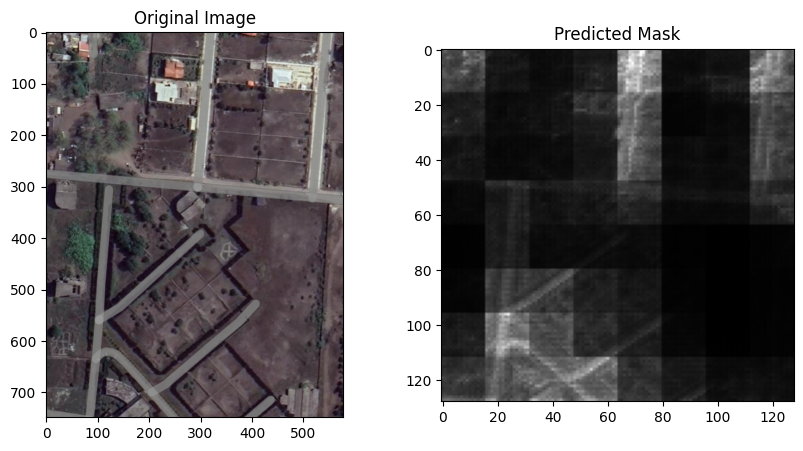

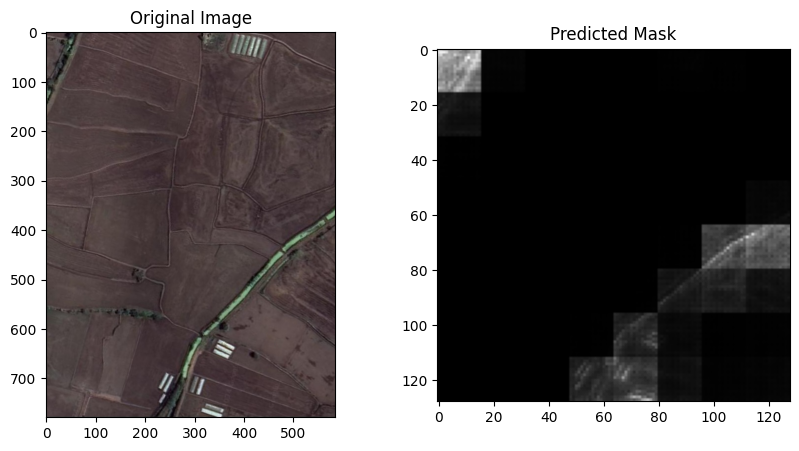

In [23]:
import os
from PIL import Image
import torch
import torchvision.transforms as transforms
import matplotlib.pyplot as plt

# مسیر تصاویر جدید
new_image_dir = '/content/drive/MyDrive/Data/DataIran'

# ایجاد لیست از فایل‌های موجود در مسیر داده‌های جدید
new_images = sorted(os.listdir(new_image_dir))

# تنظیمات پیش‌پردازش برای تصاویر جدید
transform = transforms.Compose([
    transforms.Resize((256, 256)),  # تغییر اندازه تصاویر به 256x256
    transforms.ToTensor()  # تبدیل تصویر به تنسور
])

# مدل را در حالت ارزیابی قرار دهید
model.eval()

with torch.no_grad():
    for img_name in new_images:
        img_path = os.path.join(new_image_dir, img_name)
        image = Image.open(img_path).convert("RGB")
        image = transform(image)
        image = image.unsqueeze(0)  # اضافه کردن یک بعد برای batch
        image = image.to(torch.device('cuda' if torch.cuda.is_available() else 'cpu'))

        # پیش‌بینی ماسک
        outputs = model(image)
        predicted_mask = torch.sigmoid(outputs)
        predicted_mask = predicted_mask.squeeze(0).cpu().numpy()

        # نمایش تصویر اصلی و ماسک پیش‌بینی شده
        plt.figure(figsize=(10, 5))
        plt.subplot(1, 2, 1)
        plt.imshow(Image.open(img_path).convert("RGB"))
        plt.title('Original Image')

        plt.subplot(1, 2, 2)
        plt.imshow(predicted_mask[0], cmap='gray')
        plt.title('Predicted Mask')
        plt.show()

        # ذخیره نتایج به صورت فایل تصویری
        mask_save_path = os.path.join('/content/drive/MyDrive/Data/DataIran', f'{img_name}_mask.png')
        plt.imsave(mask_save_path, predicted_mask[0], cmap='gray')

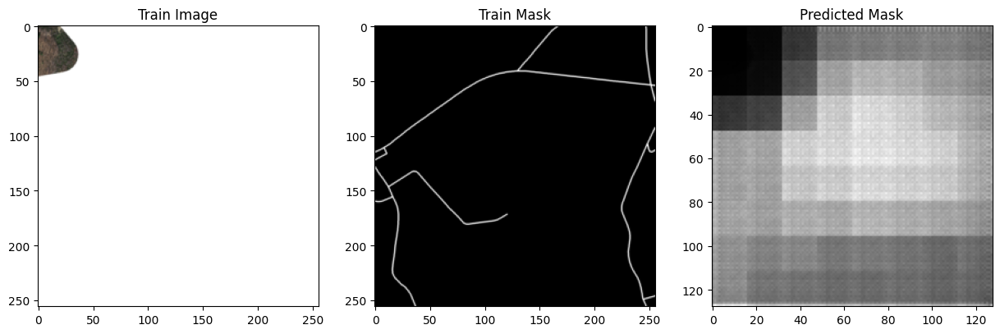

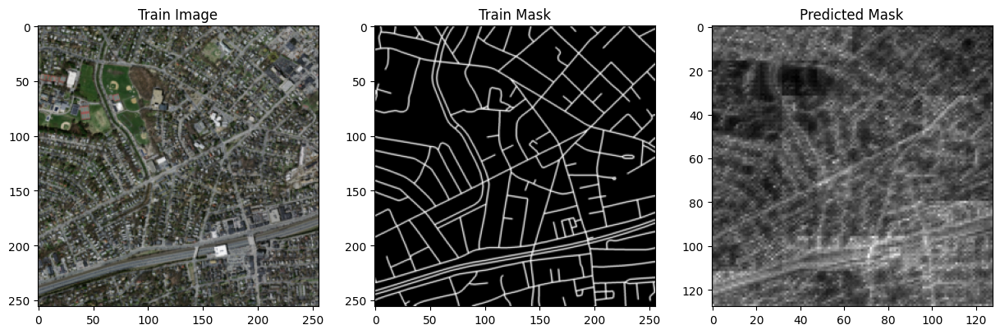

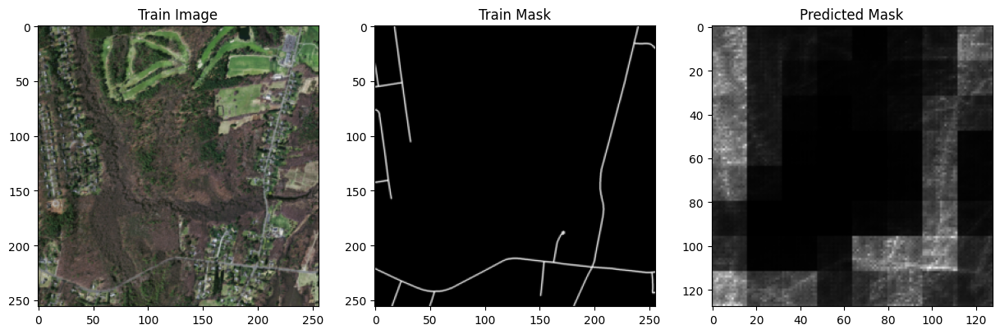

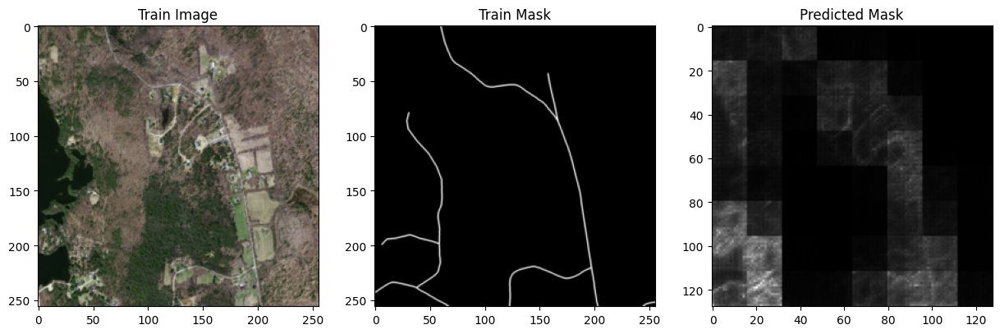

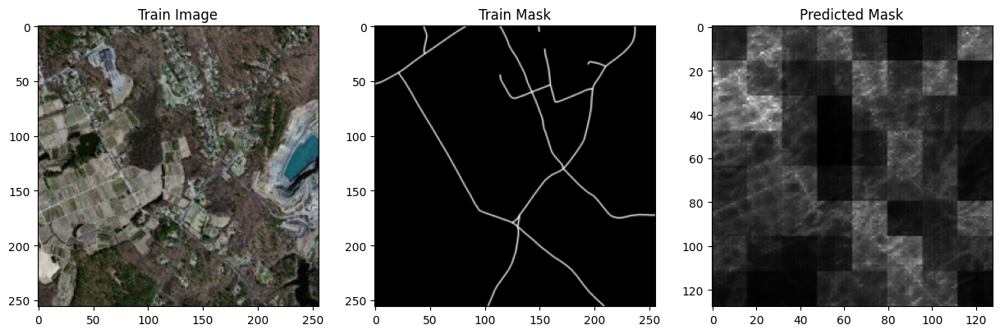

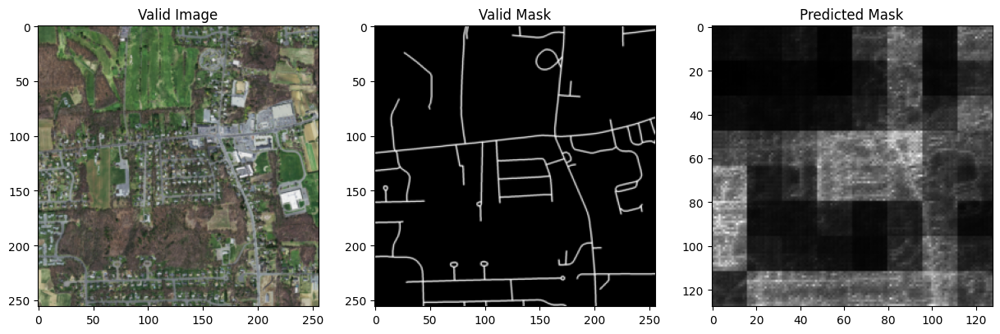

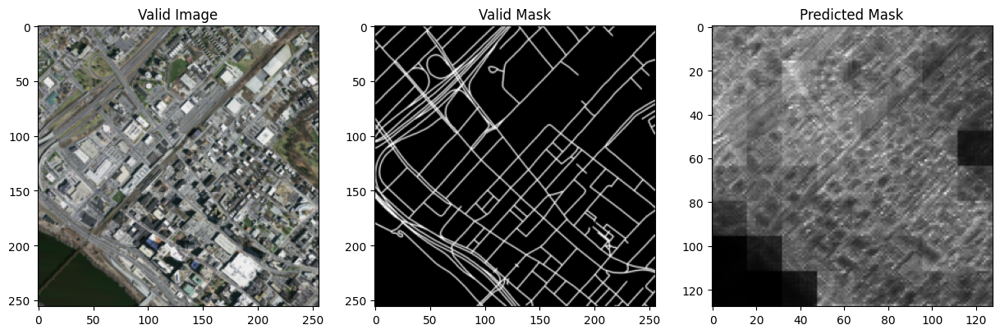

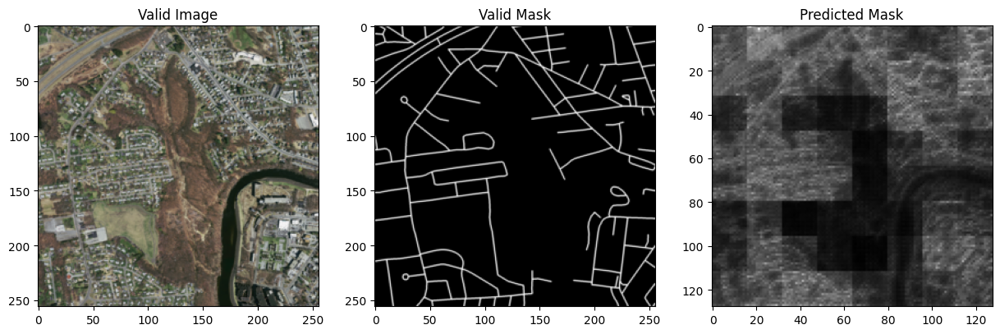

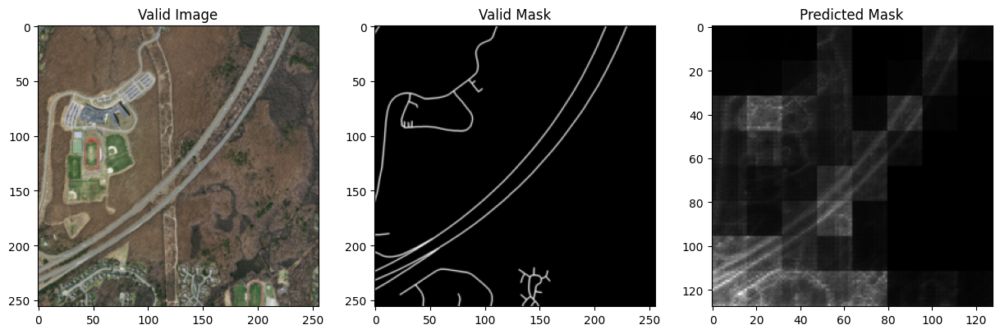

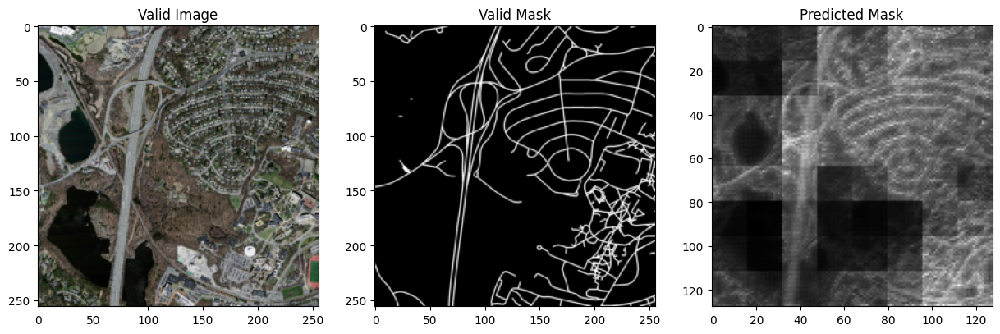

In [24]:
import matplotlib.pyplot as plt

# مدل را در حالت ارزیابی قرار دهید
model.eval()

def display_predictions(data_loader, dataset_type='train'):
    with torch.no_grad():
        for idx, (images, masks) in enumerate(data_loader):
            images = images.to(torch.device('cuda' if torch.cuda.is_available() else 'cpu'))
            masks = masks.to(torch.device('cuda' if torch.cuda.is_available() else 'cpu'))

            outputs = model(images)
            predicted_masks = torch.sigmoid(outputs)

            # نمایش اولین تصویر در batch به همراه ماسک‌های واقعی و پیش‌بینی‌شده
            for i in range(min(5, images.shape[0])):  # نمایش 5 نمونه اول
                plt.figure(figsize=(15, 5))

                plt.subplot(1, 3, 1)
                plt.imshow(images[i].cpu().permute(1, 2, 0))  # نمایش تصویر اصلی
                plt.title(f'{dataset_type.capitalize()} Image')

                plt.subplot(1, 3, 2)
                plt.imshow(masks[i].cpu().squeeze(), cmap='gray')  # نمایش ماسک واقعی
                plt.title(f'{dataset_type.capitalize()} Mask')

                plt.subplot(1, 3, 3)
                plt.imshow(predicted_masks[i].cpu().squeeze(), cmap='gray')  # نمایش ماسک پیش‌بینی‌شده
                plt.title(f'Predicted Mask')

                plt.show()

            # فقط یک batch را نمایش می‌دهیم
            break

# نمایش تصاویر و ماسک‌ها برای داده‌های آموزشی
display_predictions(train_loader, dataset_type='train')

# نمایش تصاویر و ماسک‌ها برای داده‌های اعتبارسنجی
display_predictions(val_loader, dataset_type='valid')

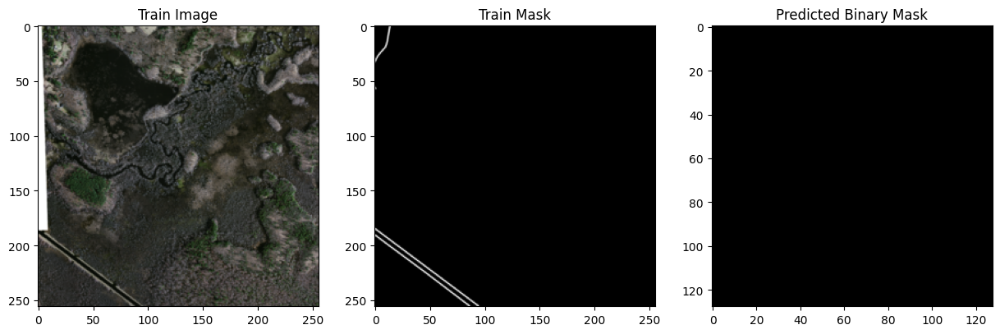

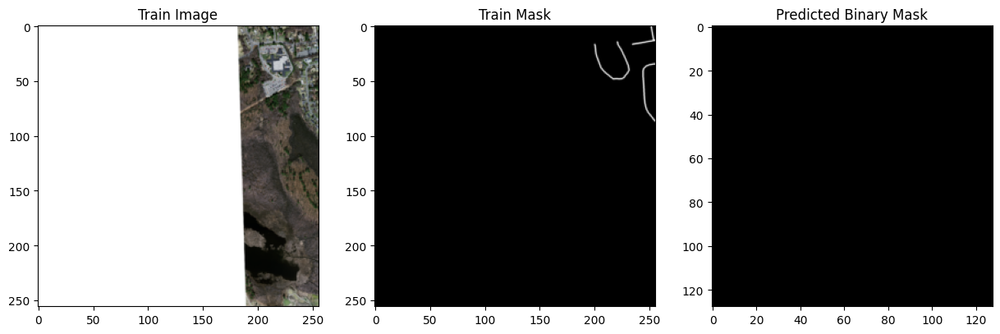

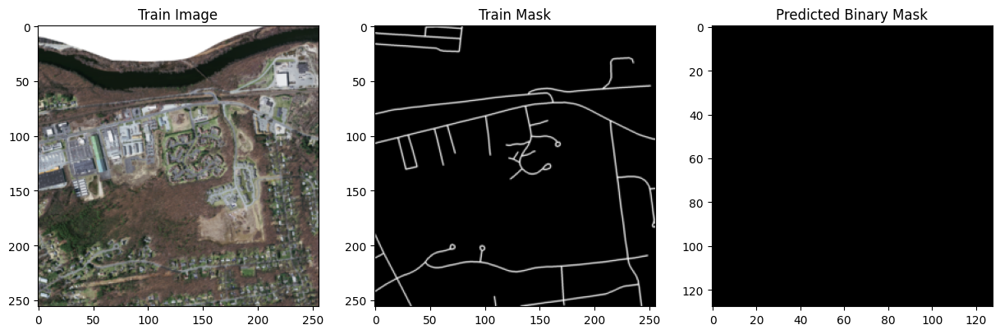

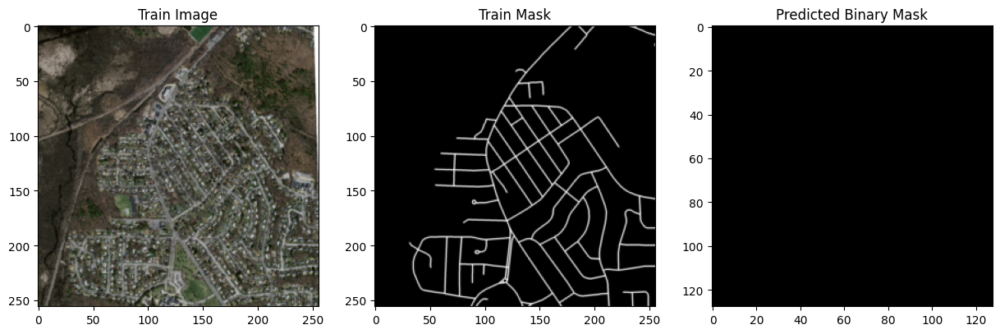

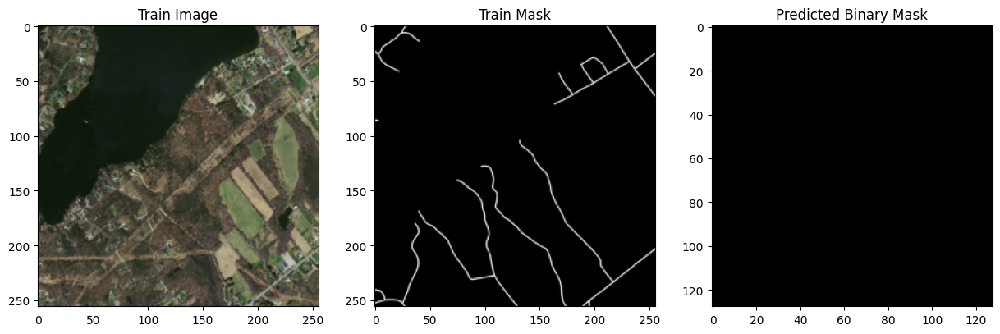

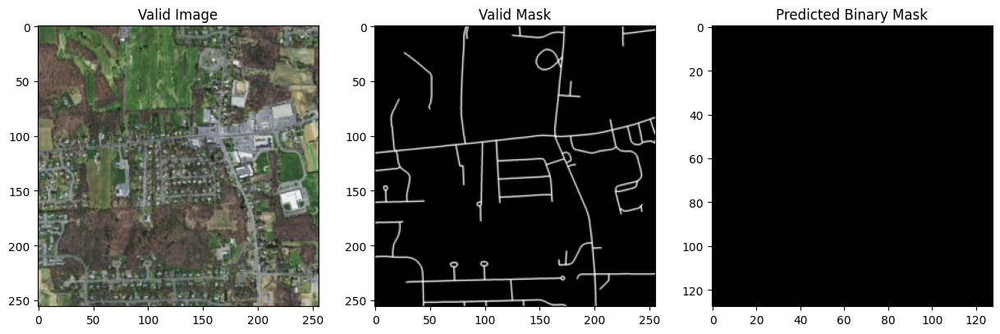

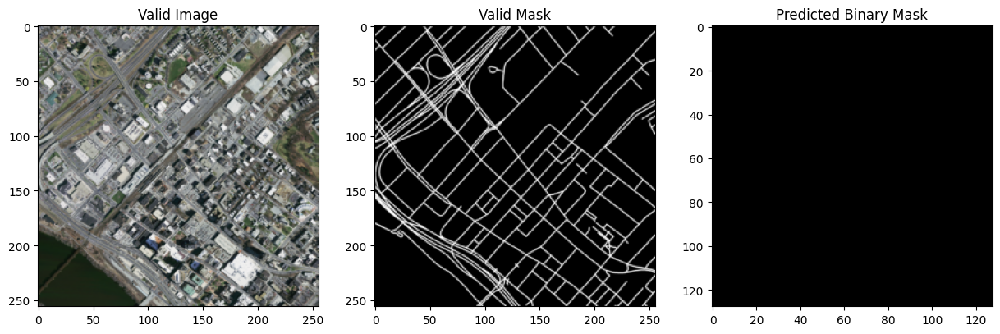

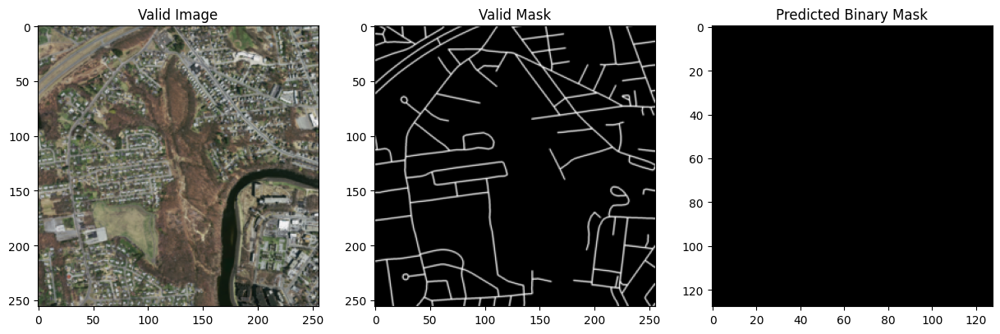

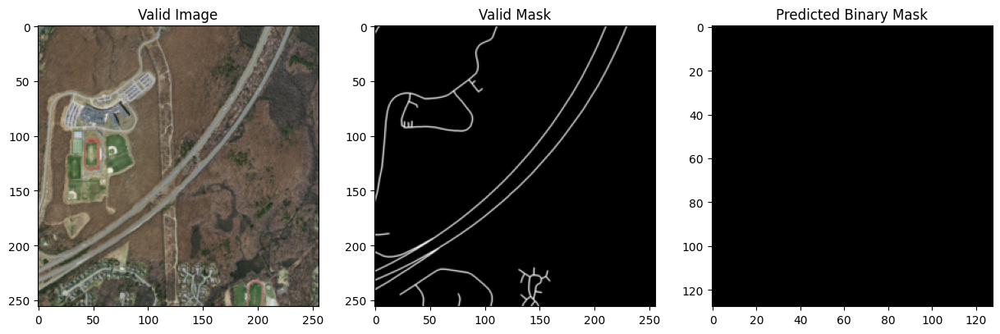

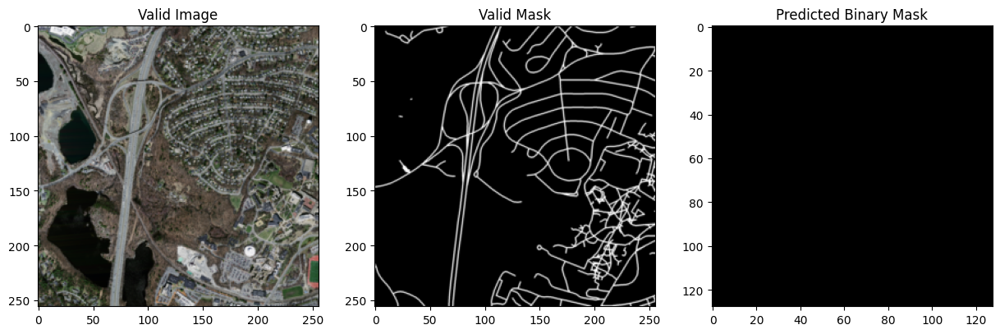

In [31]:
import matplotlib.pyplot as plt
import torch

# مدل را در حالت ارزیابی قرار دهید
model.eval()

def display_binary_predictions(data_loader, dataset_type='train'):
    with torch.no_grad():
        for idx, (images, masks) in enumerate(data_loader):
            images = images.to(torch.device('cuda' if torch.cuda.is_available() else 'cpu'))
            masks = masks.to(torch.device('cuda' if torch.cuda.is_available() else 'cpu'))

            outputs = model(images)
            predicted_masks = torch.sigmoid(outputs)

            # اعمال آستانه برای باینری کردن پیش‌بینی‌ها
            binary_masks = (predicted_masks > 0.5).float()

            # اطمینان از اینکه ماسک‌ها به درستی در دامنه 0 و 1 قرار دارند
            binary_masks = binary_masks.squeeze(1).cpu().numpy()

            # نمایش اولین تصویر در batch به همراه ماسک‌های واقعی و پیش‌بینی‌شده
            for i in range(min(5, images.shape[0])):  # نمایش 5 نمونه اول
                plt.figure(figsize=(15, 5))

                plt.subplot(1, 3, 1)
                plt.imshow(images[i].cpu().permute(1, 2, 0))  # نمایش تصویر اصلی
                plt.title(f'{dataset_type.capitalize()} Image')

                plt.subplot(1, 3, 2)
                plt.imshow(masks[i].cpu().squeeze(), cmap='gray')  # نمایش ماسک واقعی
                plt.title(f'{dataset_type.capitalize()} Mask')

                plt.subplot(1, 3, 3)
                plt.imshow(binary_masks[i], cmap='gray', vmin=0, vmax=1)  # نمایش ماسک باینری پیش‌بینی‌شده به صورت سیاه و سفید
                plt.title(f'Predicted Binary Mask')

                plt.show()

            # فقط یک batch را نمایش می‌دهیم
            break

# نمایش تصاویر و ماسک‌های باینری برای داده‌های آموزشی
display_binary_predictions(train_loader, dataset_type='train')

# نمایش تصاویر و ماسک‌های باینری برای داده‌های اعتبارسنجی
display_binary_predictions(val_loader, dataset_type='valid')